In [3]:
#%tensorflow_version 1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2
import tensorflow as tf
print(tf.__version__)

1.14.0


In [2]:
!pip install yolov3

In [4]:
from google.colab import drive 
drive.mount('/content/gdrive') # 將 google drive 掛載在 colob，
# 下載基於 keras 的 yolov3 程式碼
%cd 'gdrive/My Drive'
!git clone https://github.com/qqwweee/keras-yolo3 # 如果之前已經下載過就可以註解掉

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive
fatal: destination path 'keras-yolo3' already exists and is not an empty directory.


In [5]:
%cd '/content/gdrive/My Drive/keras-yolo3'

/content/gdrive/My Drive/keras-yolo3


In [6]:
import os
import subprocess
if not os.path.exists("model_data/yolo.h5"):
  # 下載 yolov3 的網路權重，並且把權重轉換為 keras 能夠讀取的格式
  print("Model doesn't exist, downloading...")
  os.system("wget https://pjreddie.com/media/files/yolov3.weights")
  print("Converting yolov3.weights to yolo.h5...")
  os.system("python convert.py yolov3.cfg yolov3.weights model_data/yolo.h5")
else:
  print("Model exist")

Model exist


In [7]:
from PIL import Image

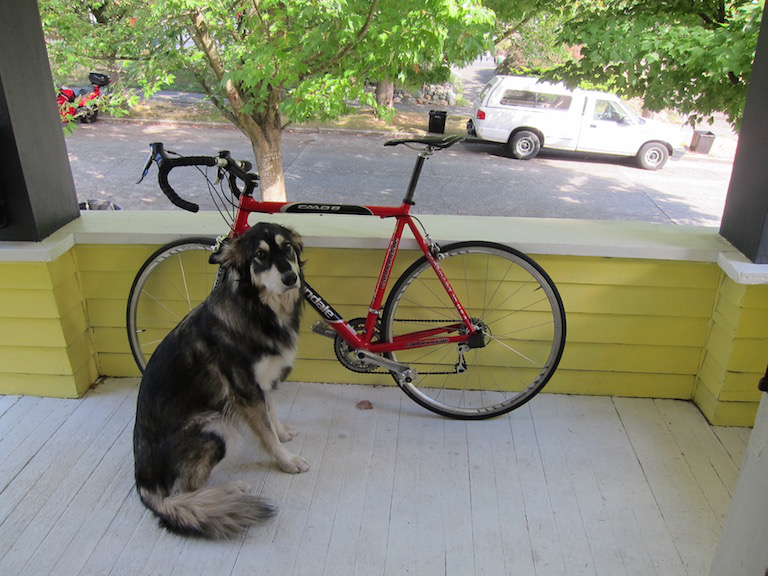

In [8]:
image = Image.open('dog.jpg') # 讀取範例圖片
image

In [9]:
import colorsys
import os
from timeit import default_timer as timer

import numpy as np
from keras import backend as K
from keras.models import load_model
from keras.layers import Input
from PIL import Image, ImageFont, ImageDraw

from yolo3.model import yolo_eval, yolo_body, tiny_yolo_body
from yolo3.utils import letterbox_image
import os
from keras.utils import multi_gpu_model

Using TensorFlow backend.


In [10]:
# 定義 YOLO class
class YOLO(object):
    _defaults = {
        "model_path": 'model_data/yolo.h5',
        "anchors_path": 'model_data/yolo_anchors.txt',
        "classes_path": 'model_data/coco_classes.txt',
        "score" : 0.3,
        "iou" : 0.45,
        "model_image_size" : (416, 416),
        "gpu_num" : 1,
    }

    @classmethod
    def get_defaults(cls, n):
        if n in cls._defaults:
            return cls._defaults[n]
        else:
            return "Unrecognized attribute name '" + n + "'"

    def __init__(self, **kwargs):
        self.__dict__.update(self._defaults) # set up default values
        self.__dict__.update(kwargs) # and update with user overrides
        self.class_names = self._get_class()
        self.anchors = self._get_anchors()
        self.sess = K.get_session()
        self.boxes, self.scores, self.classes = self.generate()

    def _get_class(self):
        classes_path = os.path.expanduser(self.classes_path)
        with open(classes_path) as f:
            class_names = f.readlines()
        class_names = [c.strip() for c in class_names]
        return class_names

    def _get_anchors(self):
        anchors_path = os.path.expanduser(self.anchors_path)
        with open(anchors_path) as f:
            anchors = f.readline()
        anchors = [float(x) for x in anchors.split(',')]
        return np.array(anchors).reshape(-1, 2)

    def generate(self):
        model_path = os.path.expanduser(self.model_path)
        assert model_path.endswith('.h5'), 'Keras model or weights must be a .h5 file.'

        # Load model, or construct model and load weights.
        num_anchors = len(self.anchors)
        num_classes = len(self.class_names)
        is_tiny_version = num_anchors==6 # default setting
        try:
            self.yolo_model = load_model(model_path, compile=False)
        except:
            self.yolo_model = tiny_yolo_body(Input(shape=(None,None,3)), num_anchors//2, num_classes) \
                if is_tiny_version else yolo_body(Input(shape=(None,None,3)), num_anchors//3, num_classes)
            self.yolo_model.load_weights(self.model_path) # make sure model, anchors and classes match
        else:
            assert self.yolo_model.layers[-1].output_shape[-1] == \
                num_anchors/len(self.yolo_model.output) * (num_classes + 5), \
                'Mismatch between model and given anchor and class sizes'

        print('{} model, anchors, and classes loaded.'.format(model_path))

        # Generate colors for drawing bounding boxes.
        hsv_tuples = [(x / len(self.class_names), 1., 1.)
                      for x in range(len(self.class_names))]
        self.colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
        self.colors = list(
            map(lambda x: (int(x[0] * 255), int(x[1] * 255), int(x[2] * 255)),
                self.colors))
        np.random.seed(10101)  # Fixed seed for consistent colors across runs.
        np.random.shuffle(self.colors)  # Shuffle colors to decorrelate adjacent classes.
        np.random.seed(None)  # Reset seed to default.

        # Generate output tensor targets for filtered bounding boxes.
        self.input_image_shape = K.placeholder(shape=(2, ))
        if self.gpu_num>=2:
            self.yolo_model = multi_gpu_model(self.yolo_model, gpus=self.gpu_num)
        boxes, scores, classes = yolo_eval(self.yolo_model.output, self.anchors,
                len(self.class_names), self.input_image_shape,
                score_threshold=self.score, iou_threshold=self.iou)
        return boxes, scores, classes
    
    # 更改 detect_image 使得其回傳需要的信息
    def detect_image(self, image):
        start = timer()

        if self.model_image_size != (None, None):
            assert self.model_image_size[0]%32 == 0, 'Multiples of 32 required'
            assert self.model_image_size[1]%32 == 0, 'Multiples of 32 required'
            boxed_image = letterbox_image(image, tuple(reversed(self.model_image_size)))
        else:
            new_image_size = (image.width - (image.width % 32),
                              image.height - (image.height % 32))
            boxed_image = letterbox_image(image, new_image_size)
        image_data = np.array(boxed_image, dtype='float32')

        print(image_data.shape)
        image_data /= 255.
        image_data = np.expand_dims(image_data, 0)  # Add batch dimension.

        out_boxes, out_scores, out_classes = self.sess.run(
            [self.boxes, self.scores, self.classes],
            feed_dict={
                self.yolo_model.input: image_data,
                self.input_image_shape: [image.size[1], image.size[0]],
                K.learning_phase(): 0
            })

        print('Found {} boxes for {}'.format(len(out_boxes), 'img'))

        font = ImageFont.truetype(font='font/FiraMono-Medium.otf',
                    size=np.floor(3e-2 * image.size[1] + 0.5).astype('int32'))
        thickness = (image.size[0] + image.size[1]) // 300

        for i, c in reversed(list(enumerate(out_classes))):
            predicted_class = self.class_names[c]
            box = out_boxes[i]
            score = out_scores[i]

            label = '{} {:.2f}'.format(predicted_class, score)
            draw = ImageDraw.Draw(image)
            label_size = draw.textsize(label, font)

            top, left, bottom, right = box
            top = max(0, np.floor(top + 0.5).astype('int32'))
            left = max(0, np.floor(left + 0.5).astype('int32'))
            bottom = min(image.size[1], np.floor(bottom + 0.5).astype('int32'))
            right = min(image.size[0], np.floor(right + 0.5).astype('int32'))
            print(label, (left, top), (right, bottom))

            if top - label_size[1] >= 0:
                text_origin = np.array([left, top - label_size[1]])
            else:
                text_origin = np.array([left, top + 1])

            # My kingdom for a good redistributable image drawing library.
            for i in range(thickness):
                draw.rectangle(
                    [left + i, top + i, right - i, bottom - i],
                    outline=self.colors[c])
            draw.rectangle(
                [tuple(text_origin), tuple(text_origin + label_size)],
                fill=self.colors[c])
            draw.text(text_origin, label, fill=(0, 0, 0), font=font)
            del draw

        end = timer()
        print(end - start)
        # return out_boxes, out_scores, out_classes
        return image

    def close_session(self):
        self.sess.close()

    # 單純 inference 的 method
    def pure_detect_image(self, image):
        if self.model_image_size != (None, None):
            assert self.model_image_size[0]%32 == 0, 'Multiples of 32 required'
            assert self.model_image_size[1]%32 == 0, 'Multiples of 32 required'
            boxed_image = letterbox_image(image, tuple(reversed(self.model_image_size)))
        else:
            new_image_size = (image.width - (image.width % 32),
                              image.height - (image.height % 32))
            boxed_image = letterbox_image(image, new_image_size)
        image_data = np.array(boxed_image, dtype='float32')

        # print(image_data.shape)
        image_data /= 255.
        image_data = np.expand_dims(image_data, 0)  # Add batch dimension.

        out_boxes, out_scores, out_classes = self.sess.run(
            [self.boxes, self.scores, self.classes],
            feed_dict={
                self.yolo_model.input: image_data,
                self.input_image_shape: [image.size[1], image.size[0]],
                K.learning_phase(): 0
            })

        return out_boxes, out_scores, out_classes

In [11]:
yolo = YOLO() # 初始化 YOLO class








model_data/yolo.h5 model, anchors, and classes loaded.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [12]:
tiny_yolo_model_path = "model_data/yolov3-tiny.h5"
tiny_yolo_anchor_file = "model_data/tiny_yolo_anchors.txt"
if not os.path.exists(tiny_yolo_model_path):
  print("yolov3-tiny weights doesn't exist, downloading...")
  os.system("wget https://pjreddie.com/media/files/yolov3-tiny.weights")
  print("Converting yolov3-tiny.weights to yolov3-tiny.h5...")
  os.system("python convert.py yolov3-tiny.cfg yolov3-tiny.weights %s" % tiny_yolo_model_path)
  if os.path.exists(tiny_yolo_model_path):
    print("Done!")
  else:
    print("Strange, model doesn't exist, pleace check")

In [13]:
config_dict = {
    'model_path': tiny_yolo_model_path, 
    'anchors_path': tiny_yolo_anchor_file
    }

In [14]:
tiny_yolo = YOLO(**config_dict)


model_data/yolov3-tiny.h5 model, anchors, and classes loaded.


In [15]:
results = tiny_yolo.pure_detect_image(image)

In [16]:
results

(array([[152.04587, 204.18745, 449.3269 , 576.96796],
        [ 70.44227, 467.15076, 170.02475, 676.873  ],
        [ 82.68793, 482.32635, 170.26566, 672.67804],
        [189.20601, 132.33978, 514.4646 , 368.82672]], dtype=float32),
 array([0.502887  , 0.71658987, 0.40737826, 0.5913767 ], dtype=float32),
 array([ 1,  2,  7, 16], dtype=int32))

In [ ]:
!git clone https://github.com/experiencor/kangaroo.git

Cloning into 'kangaroo'...
remote: Enumerating objects: 334, done.
remote: Total 334 (delta 0), reused 0 (delta 0), pack-reused 334
Receiving objects: 100% (334/334), 18.39 MiB | 25.31 MiB/s, done.
Resolving deltas: 100% (158/158), done.
Checking out files: 100% (329/329), done.


In [ ]:
if not os.path.exists('animals_train.txt'):
  import xml.etree.ElementTree as ElementTree # 載入能夠 Parser xml 文件的 library
  
  sets = ['train', 'validation' ,'test']
  classes = ["raccoon", "kangaroo"]
  
  def dump_info(xml_path, list_file):
    f = open(xml_path)
    tree = ElementTree.parse(f)
    root = tree.getroot()
      
    for obj in tree.iter('object'):
      diff = int(obj.find('difficult').text)
      cls_name = obj.find('name').text
      if cls_name not in classes or diff == 1:
          continue
          
      cls_index = classes.index(cls_name)
      bndbox = obj.find('bndbox')

      b = (int(bndbox.find('xmin').text), int(bndbox.find('ymin').text), int(bndbox.find('xmax').text), int(bndbox.find('ymax').text))
      list_file.write(" " + ",".join([str(a) for a in b]) + ',' + str(cls_index))

    f.close()

  images_dir = ['raccoon_dataset/images', 'kangaroo/images']
  for s in sets:
    list_file = open('animals_%s.txt' % s, 'w')
    
    for i, annotation_path in enumerate(['raccoon_dataset/annotations', 'kangaroo/annots']):
      annots = os.listdir(annotation_path)
      annots.sort()
      annot_size = len(annots)
      train_num = int(np.round(annot_size * 0.7))
      val_num = int(np.round(annot_size * 0.2))
      
      if s == 'train':
          data = annots[:train_num]
      elif s=='validation':
          data = annots[train_num:train_num+val_num]
      else:
          data = annots[train_num+val_num:]
          
      for d in data:
        name = d.split('.')[0]
        list_file.write(os.path.join(images_dir[i], '%s.jpg' % name))
        dump_info(os.path.join(annotation_path, d), list_file)
        list_file.write('\n')
    
    list_file.close()

In [17]:
with open('animals_train.txt') as f:
    train_lines = f.readlines()
with open('animals_validation.txt') as f:
    val_lines = f.readlines()
with open('animals_test.txt') as f:
    test_lines = f.readlines()

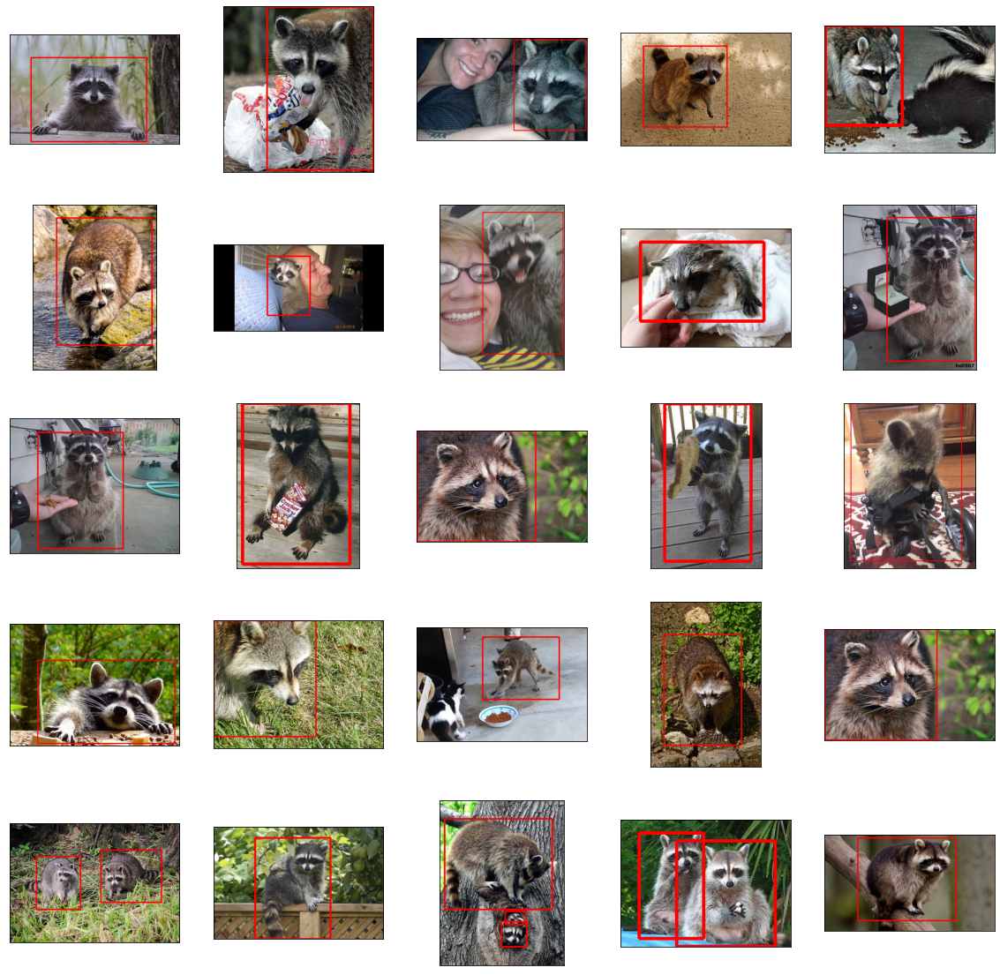

In [18]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
for i in range(25):
    line = train_lines[i].split()
    image = Image.open(line[0])
    boxs = np.array([np.array(list(map(int,boxs.split(',')))) for boxs in line[1:]])
    draw = ImageDraw.Draw(image)
    for box in boxs:
        top, left, bottom, right,label = box
        draw.line(((top,left),(top,right),(bottom,right),(bottom,left),(top,left)), fill="red", width=5)
    ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
    plt.imshow(image)

# Kangaroo

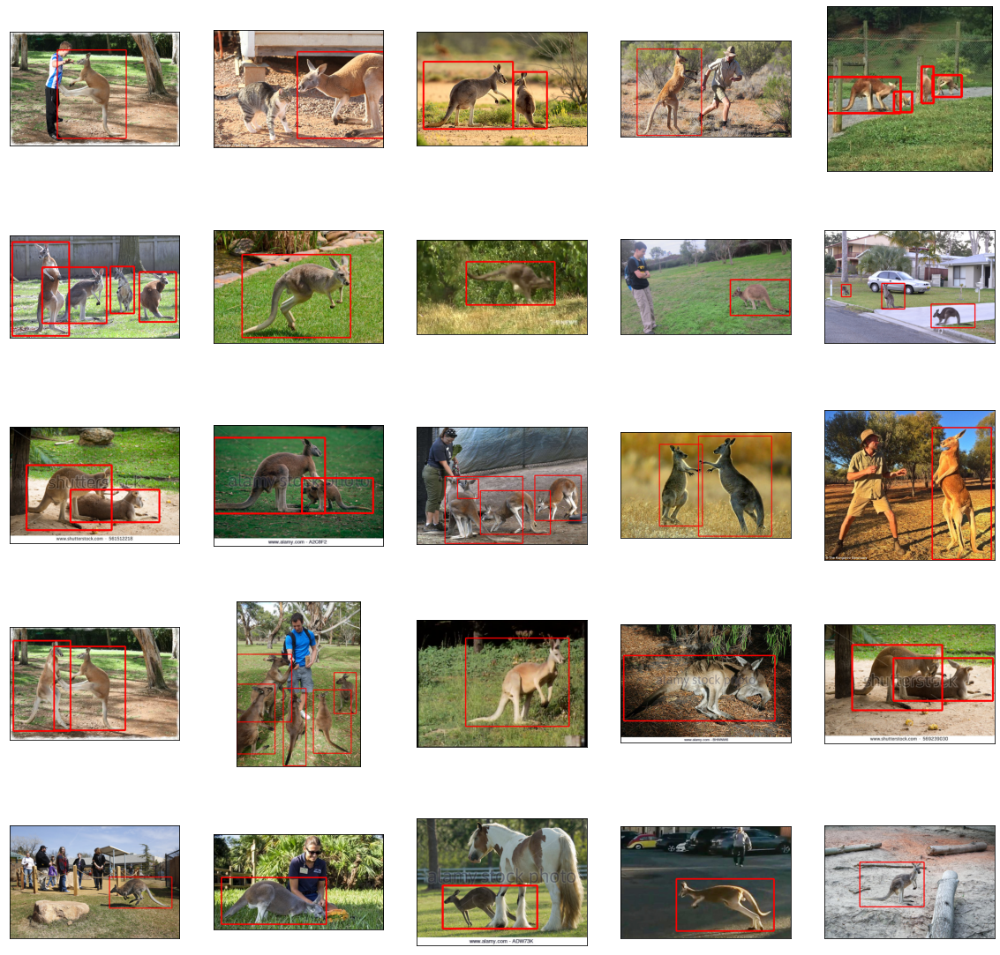

In [19]:
fig = plt.figure(figsize=(20,20))
for i in range(len(train_lines)-25,len(train_lines)):
    line = train_lines[i].split()
    image = Image.open(line[0])
    boxs = np.array([np.array(list(map(int,boxs.split(',')))) for boxs in line[1:]])
    draw = ImageDraw.Draw(image)
    for box in boxs:
        top, left, bottom, right,label = box
        draw.line(((top,left),(top,right),(bottom,right),(bottom,left),(top,left)), fill="red", width=5)
    ax = fig.add_subplot(5, 5, i + 1 - (len(train_lines)-25), xticks=[], yticks=[])
    plt.imshow(image)

In [20]:
def augment_data(img, boxs):
  img = np.asarray(img)
  rows, cols = img.shape[0:2]

  # np.copy(img)複製圖片
  new_img = np.copy(img)

  # 翻轉圖片
  new_img = img[::, ::-1]
  new_boxs = []
  # 翻轉boxs
  for box in boxs:
    top, left, bottom, right,label = box
    top = cols - top
    bottom = cols - bottom
    
    new_boxs.append([top,left,bottom,right,label])
  new_boxs = np.array(new_boxs) 
  return Image.fromarray(np.uint8(new_img)),new_boxs

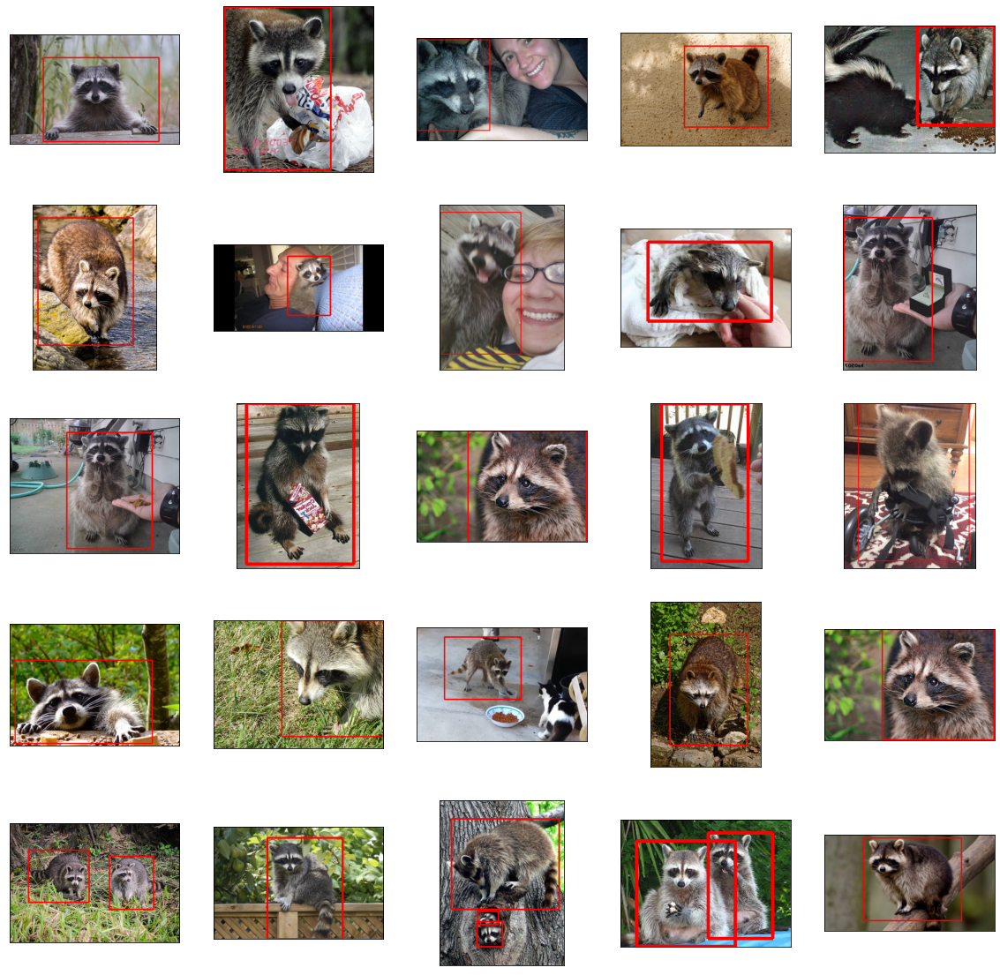

In [21]:
fig = plt.figure(figsize=(20,20))
for i in range(25):
  line = train_lines[i].split()
  image = Image.open(line[0])
  boxs = np.array([np.array(list(map(int,boxs.split(',')))) for boxs in line[1:]])
  image,boxs = augment_data(image,boxs)
  draw = ImageDraw.Draw(image)
  for box in boxs:
      top, left, bottom, right,label = box
      draw.line(((top,left),(top,right),(bottom,right),(bottom,left),(top,left)), fill="red", width=5)
  ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
  plt.imshow(image)

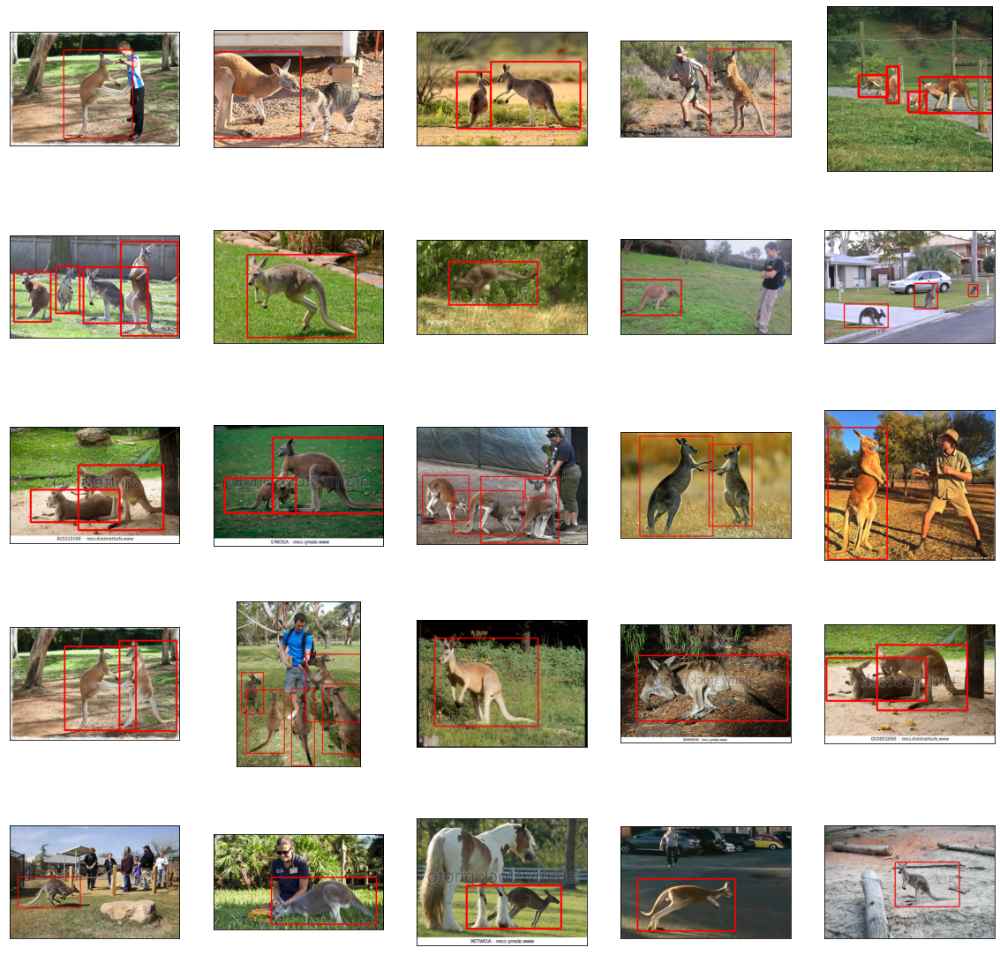

In [22]:
fig = plt.figure(figsize=(20,20))
for i in range(len(train_lines)-25,len(train_lines)):
  line = train_lines[i].split()
  image = Image.open(line[0])
  boxs = np.array([np.array(list(map(int,boxs.split(',')))) for boxs in line[1:]])
  image,boxs = augment_data(image,boxs)
  draw = ImageDraw.Draw(image)
  for box in boxs:
      top, left, bottom, right,label = box
      draw.line(((top,left),(top,right),(bottom,right),(bottom,left),(top,left)), fill="red", width=5)
  ax = fig.add_subplot(5, 5, i + 1 - (len(train_lines)-25), xticks=[], yticks=[])
  plt.imshow(image)

# Yolo-v3

In [ ]:
if not os.path.exists('model_data/yolov3-tiny.h5'):
    os.system('python convert.py yolov3-tiny.cfg yolov3-tiny.weights model_data/yolov3-tiny.h5')

In [23]:
# 將 yolo.py 所需要的套件載入
from timeit import default_timer as timer

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

from keras import backend as K
from keras.models import load_model,Model
from keras.layers import Input,Lambda
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from train import get_classes, get_anchors, create_model, create_tiny_model
from yolo import YOLO
from yolo3.model import yolo_eval, yolo_body, tiny_yolo_body
from yolo3.utils import letterbox_image

from keras.utils import multi_gpu_model

In [25]:
import time
annotation_path = 'animals_train.txt' # 轉換好格式的標註檔案
log_dir = 'logs/%s/' % str(int(time.time()))# 訓練好的模型儲存的路徑
classes_path = 'model_data/classes.txt'
anchors_path = 'model_data/tiny_yolo_anchors.txt'
class_names = ['raccoon', 'kangaroo']
num_classes = len(class_names)
anchors = get_anchors(anchors_path)
input_shape = (416,416) 
tiny_model = create_tiny_model(input_shape, anchors, num_classes,  freeze_body=2, weights_path='model_data/yolov3-tiny.h5')
logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
    monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=1)

Create Tiny YOLOv3 model with 6 anchors and 2 classes.


/usr/local/lib/python3.6/dist-packages/keras/engine/topology.py:3242: UserWarning: Skipping loading of weights for layer conv2d_10 due to mismatch in shape ((1, 1, 512, 21) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/topology.py:3242: UserWarning: Skipping loading of weights for layer conv2d_10 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/topology.py:3242: UserWarning: Skipping loading of weights for layer conv2d_13 due to mismatch in shape ((1, 1, 256, 21) vs (255, 256, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/topology.py:3242: UserWarning: Skipping loading of weights for layer conv2d_13 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))


Load weights model_data/yolov3-tiny.h5.
Freeze the first 42 layers of total 44 layers.


In [26]:
def data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes, is_train=True):
    '''data generator for fit_generator'''
    n = len(annotation_lines)
    i = 0
    while True:
        image_data = []
        box_data = []
        for b in range(batch_size):
            if i==0 and is_train:
                np.random.shuffle(annotation_lines)
            image, box = get_random_data(annotation_lines[i], input_shape, random=is_train)
            image_data.append(image)
            box_data.append(box)
            i = (i+1) % n
        image_data = np.array(image_data)
        box_data = np.array(box_data)
        y_true = preprocess_true_boxes(box_data, input_shape, anchors, num_classes)
        yield [image_data, *y_true], np.zeros(batch_size)

In [36]:
num_train = len(train_lines)
num_val = len(val_lines)
num_test = len(test_lines)

if True:
    tiny_model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 17
    #print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    # 模型利用 generator 產生的資料做訓練，強烈建議大家去閱讀及理解 data_generator_wrapper 在 train.py 中的實現
    history_original = tiny_model.fit_generator(data_generator(train_lines, batch_size, input_shape, anchors, num_classes, True),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator(val_lines, batch_size, input_shape, anchors, num_classes, False),
            validation_steps=max(1, num_val//batch_size),
            epochs=10,
            initial_epoch=0)
    tiny_model.save_weights('trained_weights_stage_1.h5')

Epoch 1/10
15/15 [==============================] - 71s 5s/step - loss: 25.5315 - val_loss: 18.4698
Epoch 2/10
15/15 [==============================] - 60s 4s/step - loss: 19.6835 - val_loss: 18.1461
Epoch 3/10
15/15 [==============================] - 60s 4s/step - loss: 18.2451 - val_loss: 16.9714
Epoch 4/10
15/15 [==============================] - 60s 4s/step - loss: 18.1625 - val_loss: 17.2715
Epoch 5/10
15/15 [==============================] - 61s 4s/step - loss: 17.4244 - val_loss: 17.0634
Epoch 6/10
15/15 [==============================] - 60s 4s/step - loss: 17.1271 - val_loss: 15.1317
Epoch 7/10
15/15 [==============================] - 60s 4s/step - loss: 16.5292 - val_loss: 16.1155
Epoch 8/10
15/15 [==============================] - 60s 4s/step - loss: 17.0400 - val_loss: 16.2818
Epoch 9/10
15/15 [==============================] - 59s 4s/step - loss: 16.5381 - val_loss: 15.9991
Epoch 10/10
15/15 [==============================] - 59s 4s/step - loss: 16.0989 - val_loss: 15.9354

In [37]:
def compute_iou(boxA, boxB):
  boxA = [int(x) for x in boxA]
  boxB = [int(x) for x in boxB]

  xA = max(boxA[0], boxB[0])
  yA = max(boxA[1], boxB[1])
  xB = min(boxA[2], boxB[2])
  yB = min(boxA[3], boxB[3])

  interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

  boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
  boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
  
  iou = interArea / float(boxAArea + boxBArea - interArea)

  return iou

In [38]:
# 定義 YOLO class
class YOLO(object):
    _defaults = {
        "model_path": 'model_data/yolo.h5',
        "anchors_path": 'model_data/yolo_anchors.txt',
        "classes_path": 'model_data/coco_classes.txt',
        "score" : 0.3,
        "iou" : 0.45,
        "model_image_size" : (416, 416),
        "gpu_num" : 1,
    }

    @classmethod
    def get_defaults(cls, n):
        if n in cls._defaults:
            return cls._defaults[n]
        else:
            return "Unrecognized attribute name '" + n + "'"

    def __init__(self, **kwargs):
        self.__dict__.update(self._defaults) # set up default values
        self.__dict__.update(kwargs) # and update with user overrides
        self.class_names = self._get_class()
        self.anchors = self._get_anchors()
        self.sess = K.get_session()
        self.boxes, self.scores, self.classes = self.generate()

    def _get_class(self):
        # classes_path = os.path.expanduser(self.classes_path)
        # with open(classes_path) as f:
        #     class_names = f.readlines()
        class_names = ['raccoon', 'kangaroo']
        return class_names

    def _get_anchors(self):
        anchors_path = os.path.expanduser(self.anchors_path)
        with open(anchors_path) as f:
            anchors = f.readline()
        anchors = [float(x) for x in anchors.split(',')]
        return np.array(anchors).reshape(-1, 2)

    def generate(self):
        model_path = os.path.expanduser(self.model_path)
        assert model_path.endswith('.h5'), 'Keras model or weights must be a .h5 file.'

        # Load model, or construct model and load weights.
        num_anchors = len(self.anchors)
        num_classes = len(self.class_names)
        is_tiny_version = num_anchors==6 # default setting
        try:
            self.yolo_model = load_model(model_path, compile=False)
        except:
            self.yolo_model = tiny_yolo_body(Input(shape=(None,None,3)), num_anchors//2, num_classes) \
                if is_tiny_version else yolo_body(Input(shape=(None,None,3)), num_anchors//3, num_classes)
            self.yolo_model.load_weights(self.model_path) # make sure model, anchors and classes match
        else:
            assert self.yolo_model.layers[-1].output_shape[-1] == \
                num_anchors/len(self.yolo_model.output) * (num_classes + 5), \
                'Mismatch between model and given anchor and class sizes'

        print('{} model, anchors, and classes loaded.'.format(model_path))

        # Generate colors for drawing bounding boxes.
        hsv_tuples = [(x / len(self.class_names), 1., 1.)
                      for x in range(len(self.class_names))]
        self.colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
        self.colors = list(
            map(lambda x: (int(x[0] * 255), int(x[1] * 255), int(x[2] * 255)),
                self.colors))
        np.random.seed(10101)  # Fixed seed for consistent colors across runs.
        np.random.shuffle(self.colors)  # Shuffle colors to decorrelate adjacent classes.
        np.random.seed(None)  # Reset seed to default.

        # Generate output tensor targets for filtered bounding boxes.
        self.input_image_shape = K.placeholder(shape=(2, ))
        if self.gpu_num>=2:
            self.yolo_model = multi_gpu_model(self.yolo_model, gpus=self.gpu_num)
        boxes, scores, classes = yolo_eval(self.yolo_model.output, self.anchors,
                len(self.class_names), self.input_image_shape,
                score_threshold=self.score, iou_threshold=self.iou)
        return boxes, scores, classes

    # 更改 detect_image 使得其回傳需要的信息
    def detect_image(self, image):
        start = timer()

        if self.model_image_size != (None, None):
            assert self.model_image_size[0]%32 == 0, 'Multiples of 32 required'
            assert self.model_image_size[1]%32 == 0, 'Multiples of 32 required'
            boxed_image = letterbox_image(image, tuple(reversed(self.model_image_size)))
        else:
            new_image_size = (image.width - (image.width % 32),
                              image.height - (image.height % 32))
            boxed_image = letterbox_image(image, new_image_size)
        image_data = np.array(boxed_image, dtype='float32')

        print(image_data.shape)
        image_data /= 255.
        image_data = np.expand_dims(image_data, 0)  # Add batch dimension.

        out_boxes, out_scores, out_classes = self.sess.run(
            [self.boxes, self.scores, self.classes],
            feed_dict={
                self.yolo_model.input: image_data,
                self.input_image_shape: [image.size[1], image.size[0]],
                K.learning_phase(): 0
            })

        print('Found {} boxes for {}'.format(len(out_boxes), 'img'))

        font = ImageFont.truetype(font='font/FiraMono-Medium.otf',
                    size=np.floor(3e-2 * image.size[1] + 0.5).astype('int32'))
        thickness = (image.size[0] + image.size[1]) // 300

        for i, c in reversed(list(enumerate(out_classes))):
            predicted_class = self.class_names[c]
            box = out_boxes[i]
            score = out_scores[i]

            label = '{} {:.2f}'.format(predicted_class, score)
            draw = ImageDraw.Draw(image)
            label_size = draw.textsize(label, font)

            top, left, bottom, right = box
            top = max(0, np.floor(top + 0.5).astype('int32'))
            left = max(0, np.floor(left + 0.5).astype('int32'))
            bottom = min(image.size[1], np.floor(bottom + 0.5).astype('int32'))
            right = min(image.size[0], np.floor(right + 0.5).astype('int32'))
            print(label, (left, top), (right, bottom))

            if top - label_size[1] >= 0:
                text_origin = np.array([left, top - label_size[1]])
            else:
                text_origin = np.array([left, top + 1])

            # My kingdom for a good redistributable image drawing library.
            for i in range(thickness):
                draw.rectangle(
                    [left + i, top + i, right - i, bottom - i],
                    outline=self.colors[c])
            draw.rectangle(
                [tuple(text_origin), tuple(text_origin + label_size)],
                fill=self.colors[c])
            draw.text(text_origin, label, fill=(0, 0, 0), font=font)
            del draw

        end = timer()
        #print(end - start)
        return image,out_boxes, out_scores, out_classes # Hint: 在這裡更改程式碼即可

    def close_session(self):
        self.sess.close()

In [40]:
config_dict = {
    'model_path': 'trained_weights_stage_1.h5', 
    'anchors_path': anchors_path,
    'classes_path':classes_path
    }
tiny_yolo = YOLO(**config_dict)

trained_weights_stage_1.h5 model, anchors, and classes loaded.


(416, 416, 3)
Found 0 boxes for img
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.76 (419, 248) (643, 417)
IOU : 0
(416, 416, 3)
Found 0 boxes for img
(416, 416, 3)
Found 0 boxes for img
(416, 416, 3)
Found 0 boxes for img
(416, 416, 3)
Found 2 boxes for img
raccoon 0.32 (66, 0) (526, 279)
raccoon 0.74 (0, 0) (600, 304)
IOU : 38.05300390666244
IOU : 37.35928917228463
(416, 416, 3)
Found 1 boxes for img
raccoon 0.56 (0, 0) (775, 484)
IOU : 33.041731908230645
(416, 416, 3)
Found 0 boxes for img
(416, 416, 3)
Found 0 boxes for img


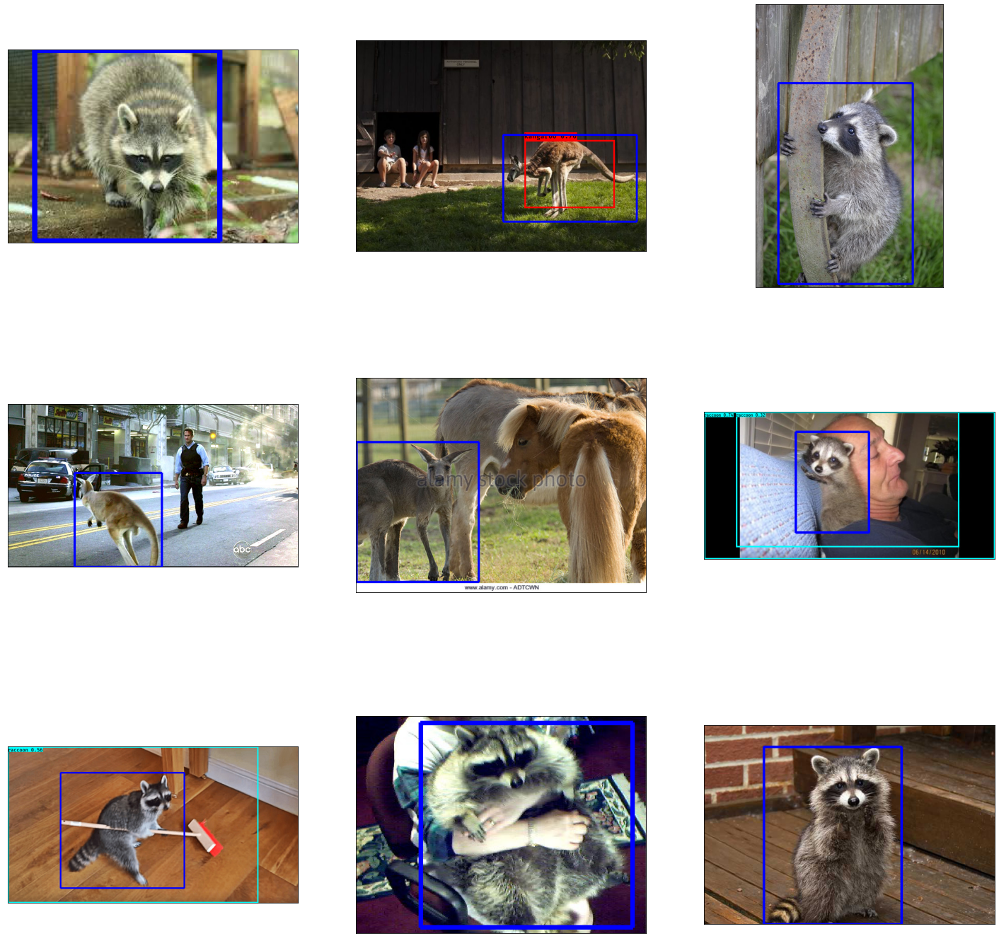

In [41]:
fig = plt.figure(figsize=(25,25))
for i in range(9):
    line = train_lines[i].split()
    image = Image.open(line[0])
    image = image.convert('RGB')
    tiny_yolo_image,out_boxes,out_scores,out_classes = tiny_yolo.detect_image(image)
    boxs = np.array([np.array(list(map(int,boxs.split(',')))) for boxs in line[1:]])
    draw = ImageDraw.Draw(tiny_yolo_image)
    for box in boxs:
        top, left, bottom, right,label = box
        draw.line(((top,left),(top,right),(bottom,right),(bottom,left),(top,left)), fill="blue", width=5)
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plt.imshow(tiny_yolo_image)
    for box in out_boxes:
        max_iou = 0
        for ground_truth in test_lines[0].split()[1:]:
            ground_truth = [int(i) for i in ground_truth.split(',')]
            iou = compute_iou(ground_truth[:-1],box)
            if(max_iou<iou):
                max_iou = iou
        print("IOU :" , max_iou*100)